In [14]:
%pip install opencv-python==4.10.0.84

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 26.2.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

print("OpenCV version:", cv2.__version__)
print("cv2 location:", cv2.__file__)
print("cv2 version:", getattr(cv2, "__version__", "No version"))
print("Has CascadeClassifier:", hasattr(cv2, "CascadeClassifier"))

OpenCV version: 4.10.0
cv2 location: C:\Users\Hp\AppData\Local\Programs\Python\Python312\Lib\site-packages\cv2\__init__.py
cv2 version: 4.10.0
Has CascadeClassifier: True


In [2]:
image = cv2.imread("group_photo.jpg")

if image is None:
    print("Image not found")
else:
    print("Image loaded successfully")
    print("Image shape:", image.shape)

Image loaded successfully
Image shape: (1800, 4000, 3)


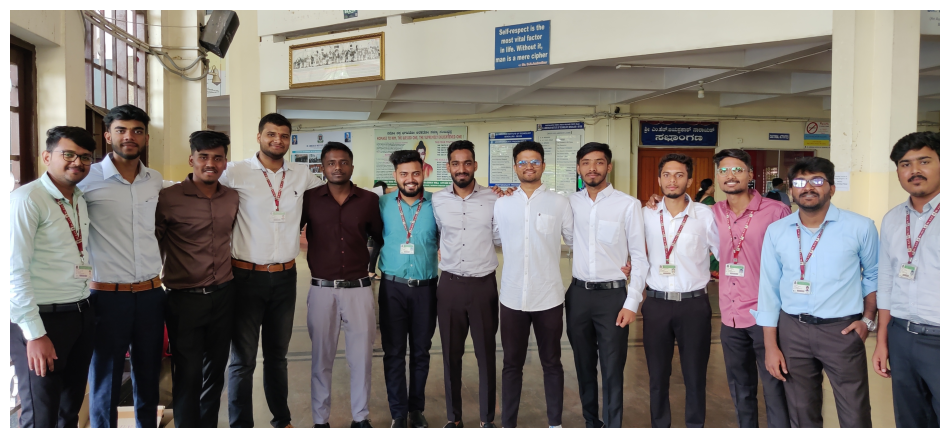

In [3]:
#converts BGR → RGB so Matplotlib displays the colors correctly.
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 7))
plt.imshow(image_rgb)
plt.axis("off")
plt.show()

In [4]:
#Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

print("Original shape:", image.shape)
print("Grayscale shape:", gray.shape)

Original shape: (1800, 4000, 3)
Grayscale shape: (1800, 4000)


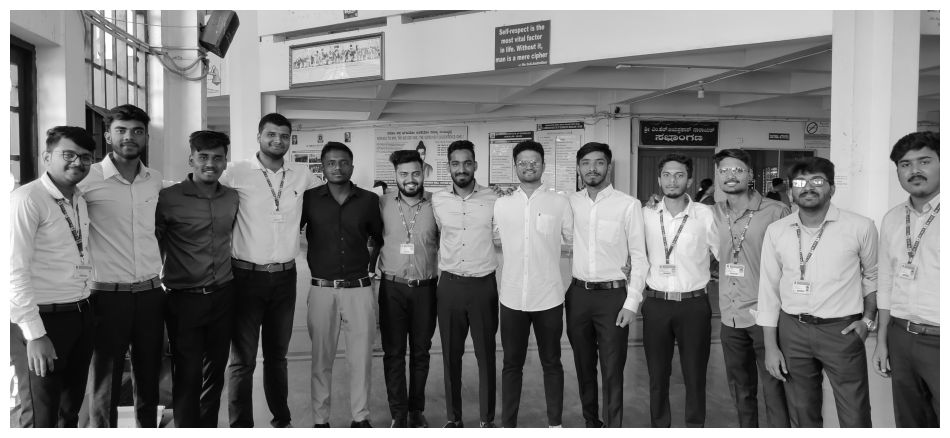

In [5]:
plt.figure(figsize=(12, 7))
plt.imshow(gray, cmap="gray")
plt.axis("off")
plt.show()

In [7]:
#Load the Haar Cascade
face_cascade = cv2.CascadeClassifier(
    cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
)

print("Haar Cascade loaded successfully")
print(face_cascade.empty())

Haar Cascade loaded successfully
False


In [8]:
#Detect the faces
faces = face_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=5,
    minSize=(30, 30)
)

print("Number of faces detected:", len(faces))

Number of faces detected: 14


In [9]:
#Draw bounding boxes
output = image.copy()

for (x, y, w, h) in faces:
    cv2.rectangle(
        output,
        (x, y),
        (x + w, y + h),
        (0, 255, 0),
        5)
    

    cv2.putText(
        output,
        "Face",
        (x, y - 15),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.5,
        (0, 255, 0),
        3)
    
    

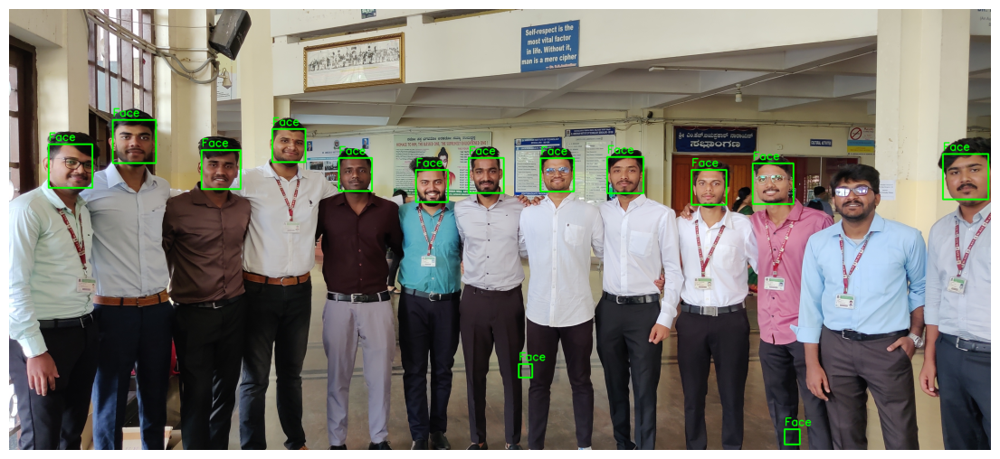

In [10]:
output_rgb = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(14, 8))
plt.imshow(output_rgb)
plt.axis("off")
plt.show()

In [17]:
#reduce the false positives by increasing minNeighbors
scaleFactor=1.1
minNeighbors=5
minSize=(30, 30)


faces = face_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=4,
    minSize=(50, 50)
)

print("Number of faces detected:", len(faces))


Number of faces detected: 14


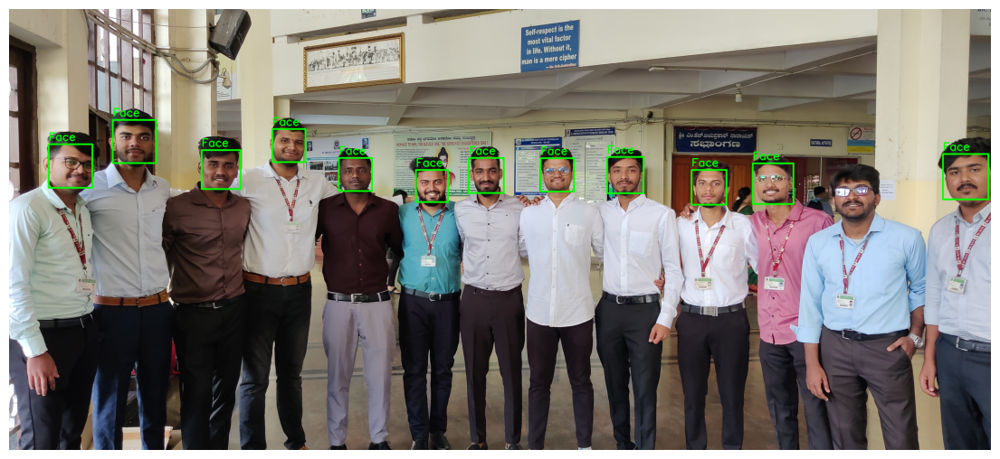

In [13]:
output = image.copy()

for (x, y, w, h) in faces:
    cv2.rectangle(
        output,
        (x, y),
        (x + w, y + h),
        (0, 255, 0),
        5
    )

    cv2.putText(
        output,
        "Face",
        (x, y - 15),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.5,
        (0, 255, 0),
        3
    )

output_rgb = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(14, 8))
plt.imshow(output_rgb)
plt.axis("off")
plt.show()

In [14]:
#resize image
small_image = cv2.resize(image, None, fx=0.5, fy=0.5)

small_gray = cv2.cvtColor(
    small_image,
    cv2.COLOR_BGR2GRAY
)

faces = face_cascade.detectMultiScale(
    small_gray,
    scaleFactor=1.1,
    minNeighbors=6,
    minSize=(30, 30)
)

print("Number of faces detected:", len(faces))

Number of faces detected: 12


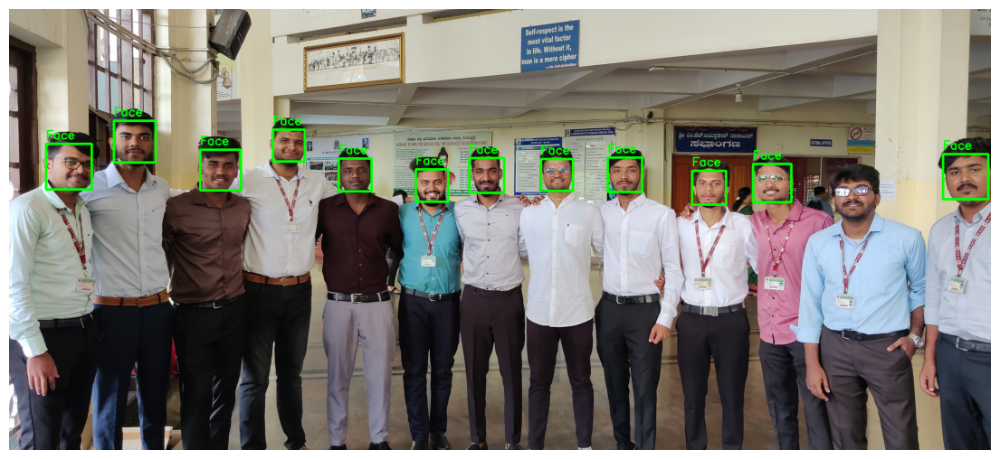

In [15]:
output = small_image.copy()

for (x, y, w, h) in faces:
    cv2.rectangle(
        output,
        (x, y),
        (x + w, y + h),
        (0, 255, 0),
        3
    )

    cv2.putText(
        output,
        "Face",
        (x, y - 10),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (0, 255, 0),
        2
    )

output_rgb = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(14, 8))
plt.imshow(output_rgb)
plt.axis("off")
plt.show()

In [21]:
#Add histogram equalization : to handle lighting variation
gray_equalized = cv2.equalizeHist(gray)

faces = face_cascade.detectMultiScale(
    gray_equalized,
    scaleFactor=1.1,
    minNeighbors=6,
    minSize=(30, 30)
)

print("Number of faces detected:", len(faces))

Number of faces detected: 15


In [22]:
#compare the parameters : It will test minNeighbors values 3, 5, 8, and 10 on the same image.

neighbor_values = [3, 5, 8, 10]

for n in neighbor_values:

    faces_test = face_cascade.detectMultiScale(
        gray,
        scaleFactor=1.1,
        minNeighbors=n,
        minSize=(30, 30)
    )

    print(f"minNeighbors = {n} --> {len(faces_test)} detections")

minNeighbors = 3 --> 16 detections
minNeighbors = 5 --> 14 detections
minNeighbors = 8 --> 12 detections
minNeighbors = 10 --> 12 detections


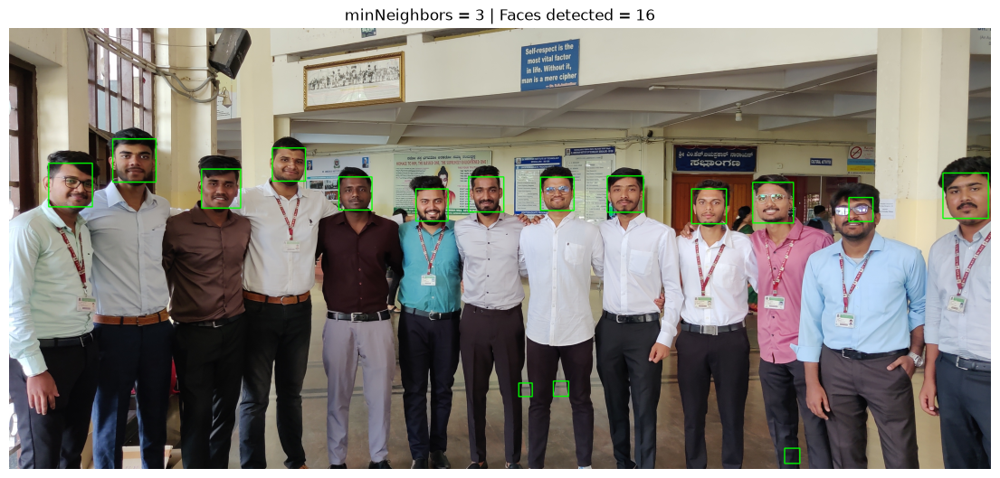

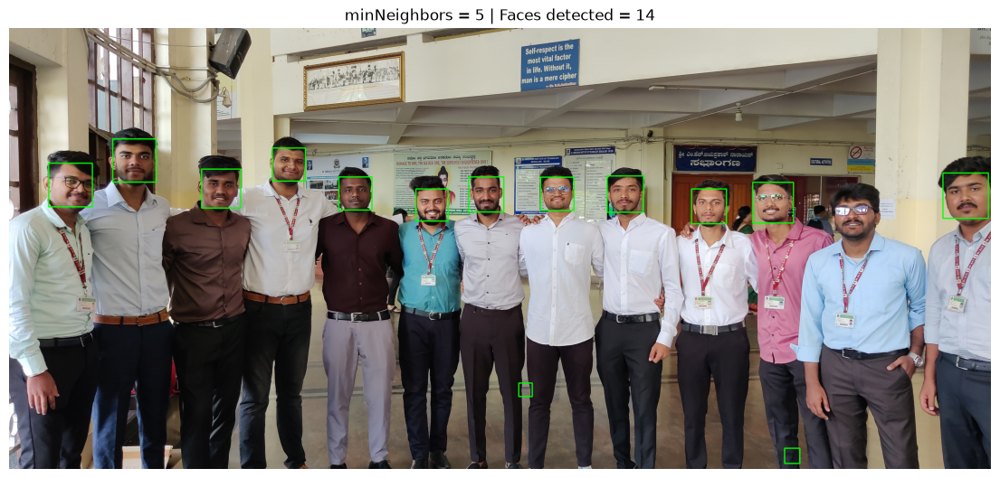

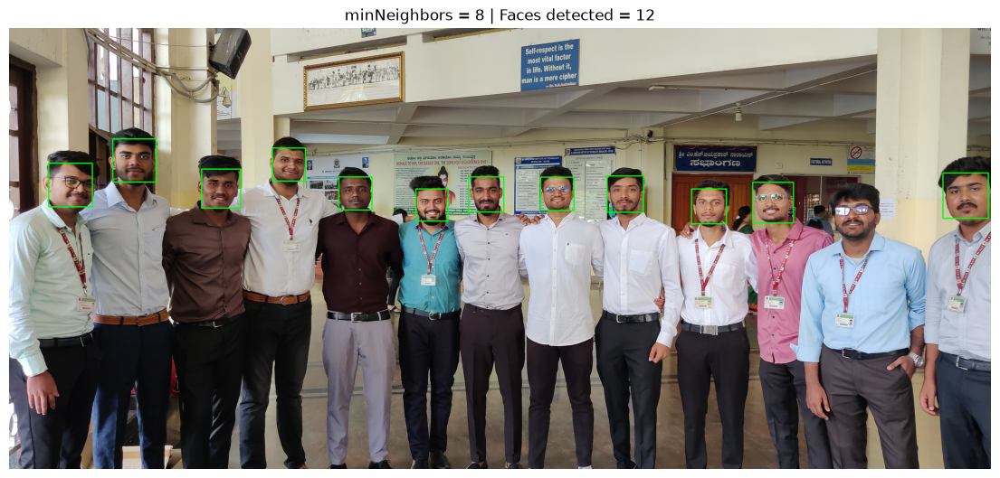

In [30]:
#visualize the best candidates
neighbor_values = [3, 5, 8]

for n in neighbor_values:

    faces_test = face_cascade.detectMultiScale(
        gray,
        scaleFactor=1.1,
        minNeighbors=n,
        minSize=(30, 30)
    )

    output_test = image.copy()

    for (x, y, w, h) in faces_test:
        cv2.rectangle(
            output_test,
            (x, y),
            (x + w, y + h),
            (0, 255, 0),
            4
        )

    output_rgb = cv2.cvtColor(
        output_test,
        cv2.COLOR_BGR2RGB
    )

    plt.figure(figsize=(14, 7))
    plt.imshow(output_rgb)
    plt.title(f"minNeighbors = {n} | Faces detected = {len(faces_test)}")
    plt.axis("off")
    plt.show()

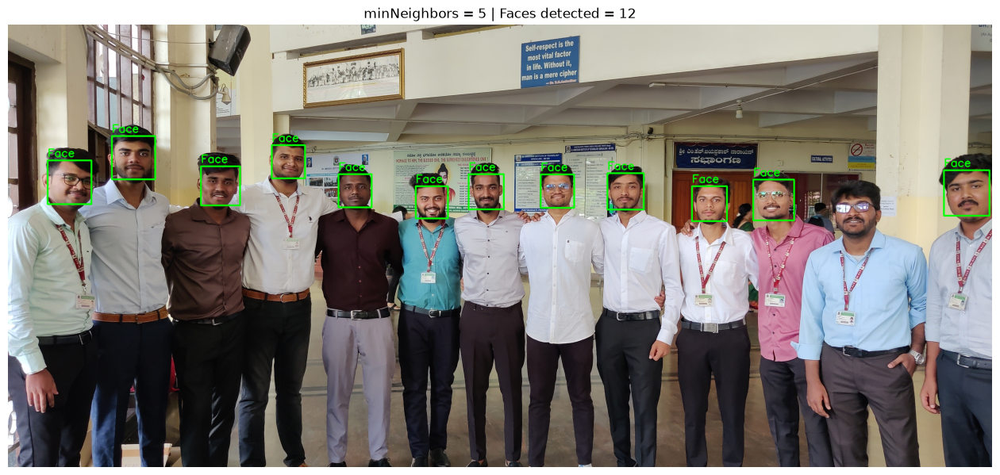

In [31]:
faces_5 = face_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=5,
    minSize=(80, 80)
)

output_5 = image.copy()

for (x, y, w, h) in faces_5:

    cv2.rectangle(
        output_5,
        (x, y),
        (x + w, y + h),
        (0, 255, 0),
        5
    )

    cv2.putText(
        output_5,
        "Face",
        (x, y - 15),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.5,
        (0, 255, 0),
        3
    )

output_5_rgb = cv2.cvtColor(
    output_5,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(16, 8))
plt.imshow(output_5_rgb)
plt.title(f"minNeighbors = 5 | Faces detected = {len(faces_5)}")
plt.axis("off")
plt.show()

In [42]:
faces_final_test = face_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=5,
    minSize=(80, 80)
)

print("Faces detected:", len(faces_final_test))

Faces detected: 12


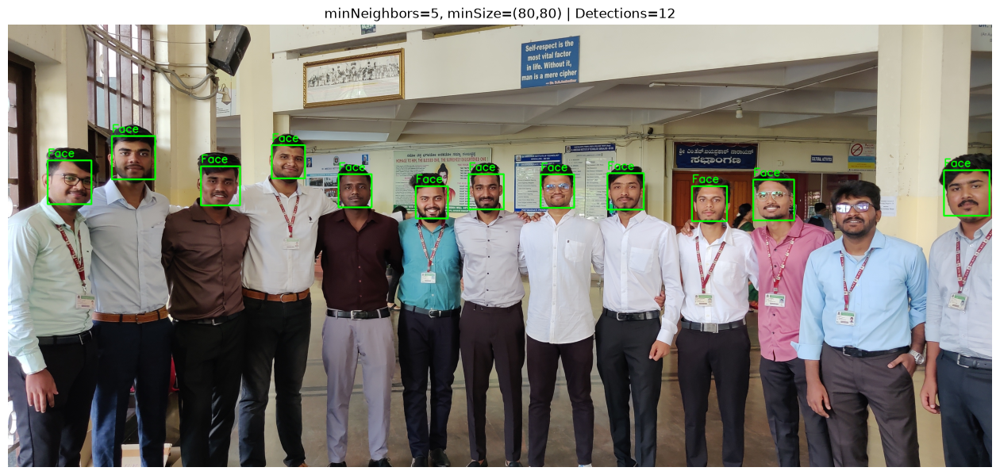

In [43]:
output = image.copy()

for (x, y, w, h) in faces_final_test:

    cv2.rectangle(
        output,
        (x, y),
        (x + w, y + h),
        (0, 255, 0),
        5
    )

    cv2.putText(
        output,
        "Face",
        (x, y - 15),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.5,
        (0, 255, 0),
        3
    )

output_rgb = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 8))
plt.imshow(output_rgb)
plt.title(
    f"minNeighbors=5, minSize=(80,80) | "
    f"Detections={len(faces_final_test)}"
)
plt.axis("off")
plt.show()